#Projeto Métodos Computacionais:
Resolver:

\begin{align}
  \frac{d^2y(x)}{dx^2}=-\left(100+\frac{1}{x^2}\right)y(x)=f(x,y)
\end{align}

\\
Dado que $y(1)=-0.24593576$ e $y'(1)=-0.55769344$

$\textbf{Intervalo: [1,10π]}$

In [1]:
import sys
import struct

#Mostrando o tipo de precisão:
print(struct.calcsize("P")*8)
sys.maxsize > 2**32 

#Mostrando a versão
!python --version

64
Python 3.7.13


##Import de bibliotecas, inicialização de constantes e criação da função f(x, y)

In [2]:
import numpy as np
import pandas as pd
import scipy.special
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML;
import plotly.express as px

rc('animation', html='html5');

y_0 = -0.24593576
z_0 = -0.55769344

In [3]:
#Calculando os valores reais, utilizando a função de bessel
x1 = np.arange(1, 10*np.pi, 0.025)
x2 = np.arange(1, 10*np.pi, 0.25)
x3 = np.arange(1, 10*np.pi, 0.5)
j_025 = []
j_25 = []
j_5 = []

#Salvando a função de bessel para cada um dos passos em 'x'
for x in x1:
  j_025.append(np.sqrt(x)*scipy.special.j0(10*x))

for x in x2:
  j_25.append(np.sqrt(x)*scipy.special.j0(10*x))

for x in x3:
  j_5.append(np.sqrt(x)*scipy.special.j0(10*x))

In [4]:
#Função dada pela questão
def f(x, y):
  return -(100+(1/x**2))*y

##Método RK4

$z=y' \rightarrow z(1)=y'(1)=-0.55769344$

$z'=y''=-\left(100+\frac{1}{x^2}\right)y(x)$

###Equações dos coeficientes:
$k_1=hz_n$

$k_2=h\left(z_n+\frac{l_1}{2}\right)$

$k_3=h\left(z_n+\frac{l_2}{2}\right)$

$k_4=h(z_n+l_3)$

$l_1=hf(x_n,y_n)$

$l_2=hf\left(x_n+\frac{h}{2},y_n+\frac{k_1}{2}\right)$

$l_3=hf\left(x_n+\frac{h}{2},y_n+\frac{k_2}{2}\right)$

$l_4=hf(x_n+h,y_n+k_3)$

In [5]:
#Função dos coeficientes
def coeficientes(h, x, y, z):
  k1 = h*z
  l1 = h*f(x,y)
  k2 = h*(z+l1/2)
  l2 = h*f(x+h/2, y+k1/2)
  k3 = h*(z+l2/2)
  l3 = h*f(x+h/2, y+k2/2)
  k4 = h*(z+l3)
  l4 = h*f(x+h, y+k3)

  c = [l1+2*l2+2*l3+l4, k1+2*k2+2*k3+k4]
  
  return c

###Solução

$y_{n+1}=y_n+\frac{1}{6}(k_1+2k_2+2k_3+k_4)$

$z_{n+1}=z_n+\frac{1}{6}(l_1+2l_2+2l_3+l_4)$

In [6]:
#Calculando pelo RK4 as soluções para h=[0.025, 0.25, 0.5]
p = np.array([0.025, 0.25, 0.5])

y_025_rk4 = []
y_25_rk4 = []
y_5_rk4 = []

for h in p:
  x = np.arange(1, 10*np.pi, h)
  y = np.zeros([len(x),1], dtype=float)
  z = np.zeros([len(x),1], dtype=float)
  y[0] = y_0
  z[0] = z_0

  for n in range(1, len(x)):
    c = coeficientes(h, x[n-1], y[n-1], z[n-1])
    z[n] = z[n-1] + (1/6)*c[0]
    y[n] = y[n-1] + (1/6)*c[1]

#Salvando os resultados em listas separadas
  if h==0.025:
    y_025_rk4 = y
  elif h==0.25:
    y_25_rk4 = y
  else:
    y_5_rk4 = y

###Comparando a solução do RK4 e o resultado exato

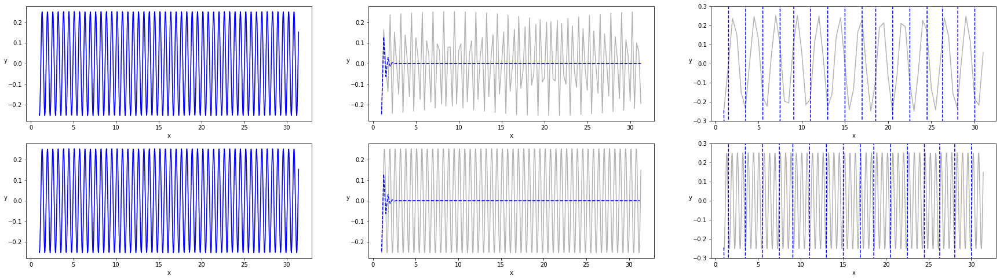

In [8]:
fig = plt.figure(figsize=(30,8))

plt.subplot(2, 3, 1)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.plot(x1, y_025_rk4, 'b')

plt.subplot(2, 3, 2)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, j_25, color='gray', alpha=0.6)
plt.plot(x2, y_25_rk4, 'b--')

plt.subplot(2, 3, 3)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, j_5, color='gray', alpha=0.6)
plt.plot(x3, y_5_rk4, 'b--')
plt.ylim(-0.3,0.3)

plt.subplot(2, 3, 4)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.plot(x1, y_025_rk4, 'b')

plt.subplot(2, 3, 5)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.plot(x2, y_25_rk4, 'b--')

plt.subplot(2, 3, 6)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.plot(x3, y_5_rk4, 'b--')
plt.ylim(-0.3,0.3)

plt.show()

##Método RK6

$z=y' \rightarrow z(1)=y'(1)=-0.55769344$

$z'=y''=-\left(100+\frac{1}{x^2}\right)y(x)$

###Equações dos coeficientes:

$k_0=h^2f(x_n, y_n)$

$k_1=h^2f\left(x_n+\frac{h}{4}, y_n+\frac{hz_n}{4}+\frac{k_0}{32}\right)$

$k_2=h^2f\left(x_n+\frac{h}{2}, y_n+\frac{hz_n}{2}-\frac{k_0}{24}+\frac{k_1}{6}\right)$

$k_3=h^2f\left(x_n+\frac{3h}{4}, y_n+\frac{3hz_n}{4}+\frac{3k_0}{32}+\frac{k_1}{8}+\frac{k_2}{16}\right)$

$k_4=h^2f\left(x_n+h, y_n+hz_n+\frac{3k_1}{7}-\frac{k_2}{14}+\frac{k_3}{7}\right)$

In [9]:
#Função dos coeficientes para o RK6
def termos(h, x, y, z):
  k0 = (h**2)*f(x, y)
  k1 = (h**2)*f(x+(h/4), y+(h*z/4)+(k0/32))
  k2 = (h**2)*f(x+(h/2), y+(h*z/2)-(k0/24)+(k1/6))
  k3 = (h**2)*f(x+(3*h/4), y+(3*h*z/4)+(3*k0/32)+(k1/8)+(k2/16))
  k4 = (h**2)*f(x+h, y+h*z+(3*k1/7)-(k2/14)+(k3/7))

  t = [7*k0+32*k1+12*k2+32*k3+7*k4, 7*k0+24*k1+6*k2+8*k3]

  return t

###Solução

$y_{n+1}=y_n+hz_n+\frac{1}{90}(7k_0+24k_1+6k_2+8k_3)$

$z_{n+1}=z_n+\frac{1}{90h}(7k_0+32k_1+12k_2+32k_3+7k_4)$

In [10]:
#Calculando pelo RK6 as soluções para h=[0.025, 0.25, 0.5]
p = [0.025, 0.25, 0.5]

y_025_rk6 = []
y_25_rk6 = []
y_5_rk6 = []

for h in p:
  x = np.arange(1, 10*np.pi, h)
  y = np.zeros([len(x),1], dtype=float)
  z = np.zeros([len(x),1], dtype=float)
  y[0] = y_0
  z[0] = z_0

  for n in range(1, len(x)):
    t = termos(h, x[n-1], y[n-1], z[n-1])
    z[n] = z[n-1] + (1/(90*h))*t[0]
    y[n] = y[n-1] + h*z[n-1] + (1/90)*t[1]
    
#Salvando as soluções para cada h
  if h==0.025:
    y_025_rk6 = y
  elif h==0.25:
    y_25_rk6 = y
  else:
    y_5_rk6 = y

###Comparando a solução do RK6 e o resultado exato

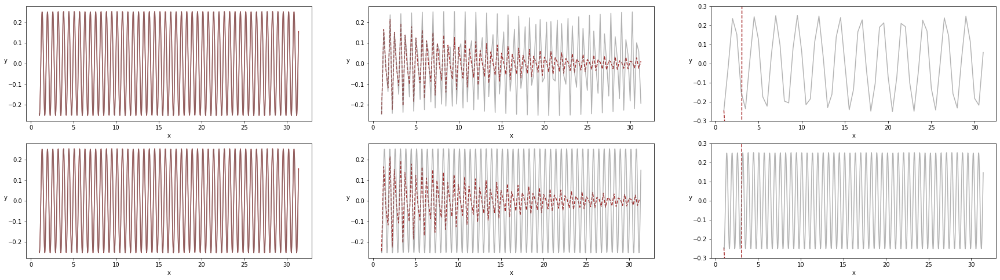

In [11]:
fig = plt.figure(figsize=(30,8))

plt.subplot(2, 3, 1)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk6, color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(2, 3, 2)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk6, '--', color='brown')
plt.plot(x2, j_25, color='gray', alpha=0.6)

plt.subplot(2, 3, 3)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk6, '--', color='brown')
plt.plot(x3, j_5, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.subplot(2, 3, 4)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk6, color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(2, 3, 5)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk6, '--', color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(2, 3, 6)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk6, '--', color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.show()

##Análises Comparativas

###Comparando os resultados do RK4 e do RK6

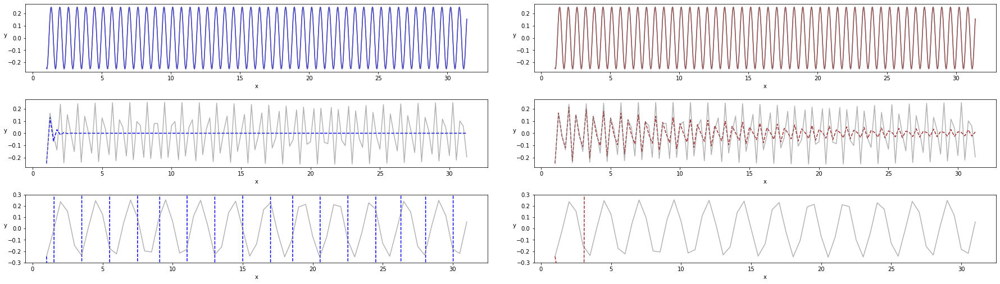

In [12]:
#Gráficos com a função de bessel calculada com os mesmos valores de 'x' da solução.
fig = plt.figure(figsize=(30,8))

plt.subplots_adjust(left=0.1, 
                    bottom=0.1,  
                    right=0.9,  
                    top=0.9,  
                    wspace=0.1,  
                    hspace=0.4)

plt.subplot(3, 2, 1)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk4, color='blue')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 2)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk6, color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 3)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk4, '--', color='blue')
plt.plot(x2, j_25, color='gray', alpha=0.6)

plt.subplot(3, 2, 4)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk6, '--', color='brown')
plt.plot(x2, j_25, color='gray', alpha=0.6)

plt.subplot(3, 2, 5)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk4, '--', color='blue')
plt.plot(x3, j_5, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.subplot(3, 2, 6)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk6, '--', color='brown')
plt.plot(x3, j_5, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.show()

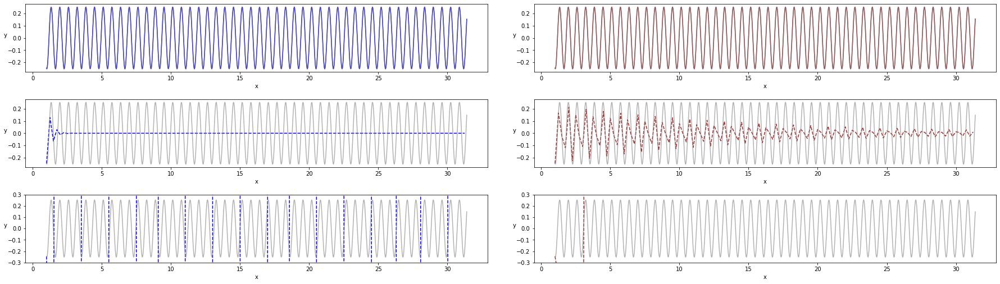

In [13]:
#Gráficos com a função de bessel calculada com o menor 'h'.
fig = plt.figure(figsize=(30,8))

plt.subplots_adjust(left=0.1, 
                    bottom=0.1,  
                    right=0.9,  
                    top=0.9,  
                    wspace=0.1,  
                    hspace=0.4)

plt.subplot(3, 2, 1)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk4, 'b')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 2)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x1, y_025_rk6, color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 3)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk4, 'b--')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 4)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x2, y_25_rk6, '--', color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)

plt.subplot(3, 2, 5)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk4, 'b--')
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.subplot(3, 2, 6)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.plot(x3, y_5_rk6, '--', color='brown')
plt.plot(x1, j_025, color='gray', alpha=0.6)
plt.ylim(-0.3,0.3)

plt.savefig("Grafico_RK462.png")
plt.show()

###Comparação dos resultados com a variação de 'h' para o RK4 e RK6

In [14]:
hs = np.arange(0.001, 1.01, 0.001)
x = []
yrk4 = []
yrk6 = []
y_exato = []

#Gerando o y exato com a função de bessel
x_01 = np.arange(1, 10*np.pi, 0.001)
for i in x_01:
  y_exato.append(np.sqrt(i)*scipy.special.j0(10*i))
#-----------------------------------------

#Gerando todas as variações de x e os valores de y
for h in hs:
  x_ = np.arange(1, 10*np.pi, h)
  x.append(x_)

  y_rk4 = np.zeros([len(x_),1], dtype=float)
  z_rk4 = np.zeros([len(x_),1], dtype=float)
  y_rk4[0] = y_0
  z_rk4[0] = z_0

  y_rk6 = np.zeros([len(x_),1], dtype=float)
  z_rk6 = np.zeros([len(x_),1], dtype=float)
  y_rk6[0] = y_0
  z_rk6[0] = z_0

  for n in range(1, len(x_)):
    c = coeficientes(h, x_[n-1], y_rk4[n-1], z_rk4[n-1])
    z_rk4[n] = z_rk4[n-1] + (1/6)*c[0]
    y_rk4[n] = y_rk4[n-1] + (1/6)*c[1]

    t = termos(h, x_[n-1], y_rk6[n-1], z_rk6[n-1])
    z_rk6[n] = z_rk6[n-1] + (1/(90*h))*t[0]
    y_rk6[n] = y_rk6[n-1] + h*z_rk6[n-1] + (1/90)*t[1]

  yrk4.append(y_rk4)
  yrk6.append(y_rk6)
#------------------------------------------------

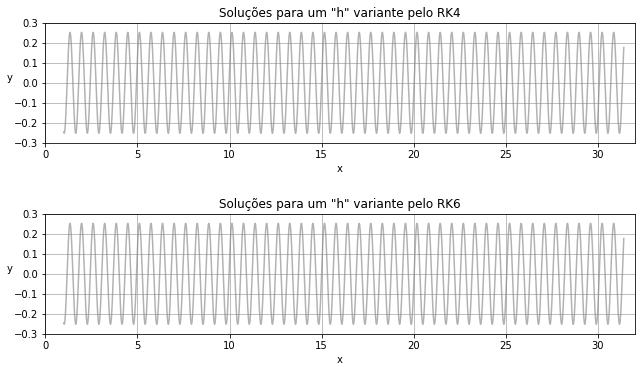

In [15]:
fig, (axRK4, axRK6) = plt.subplots(2, 1)
fig.set_size_inches((10,6))
fig.tight_layout(pad=5.0)

axRK4.set_title('Soluções para um "h" variante pelo RK4')
axRK4.set_xlabel('x')
axRK4.set_ylabel('y', rotation=0)
axRK4.set_xlim([0,32])
axRK4.set_ylim([-0.3,0.3])
axRK4.grid(True)
axRK4.plot(x[0], y_exato, '-', color='gray', alpha=0.6)

axRK6.set_title('Soluções para um "h" variante pelo RK6')
axRK6.set_xlabel('x')
axRK6.set_ylabel('y', rotation=0)
axRK6.set_xlim([0,32])
axRK6.set_ylim([-0.3,0.3])
axRK6.grid(True)
axRK6.plot(x[0], y_exato, '-', color='gray', alpha=0.6)

In [16]:
lista_rk4, = axRK4.plot([], [], '-', color='blue')
lista_rk6, = axRK6.plot([], [], '-', color='brown')

In [17]:
def graficos(i):
  lista_rk4.set_data(x[i], yrk4[i])
  lista_rk4.set_label('h = '+str(round(hs[i], 3)))
  lista_rk6.set_data(x[i], yrk6[i])
  lista_rk6.set_label('h = '+str(round(hs[i], 3)))
  axRK4.legend(loc='upper right')
  axRK6.legend(loc='upper right')

  return (lista_rk4, lista_rk6,)

In [18]:
anim = animation.FuncAnimation(fig, graficos, frames=500, interval=60)
anim

###Comportamento da solução RK4 para um 'h' variante

In [19]:
hs = np.arange(0.001, 1.01, 0.001)
x = []
y = []
y_exato = []

#Gerando o y exato com a função de bessel
x_01 = np.arange(1, 10*np.pi, 0.001)
for i in x_01:
  y_exato.append(np.sqrt(i)*scipy.special.j0(10*i))
#-----------------------------------------

#Gerando todas as variações de x e os valores de y
for h in hs:
  x_ = np.arange(1, 10*np.pi, h)
  x.append(x_)

  y_ = np.zeros([len(x_),1], dtype=float)
  z_ = np.zeros([len(x_),1], dtype=float)
  y_[0] = y_0
  z_[0] = z_0

  for n in range(1, len(x_)):
    c = coeficientes(h, x_[n-1], y_[n-1], z_[n-1])
    z_[n] = z_[n-1] + (1/6)*c[0]
    y_[n] = y_[n-1] + (1/6)*c[1]

  y.append(y_)
#------------------------------------------------

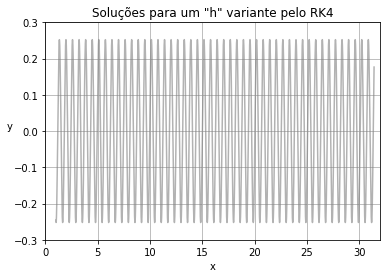

In [20]:
fig, ax = plt.subplots()

ax.set_title('Soluções para um "h" variante pelo RK4')
ax.set_xlabel('x')
ax.set_ylabel('y', rotation=0)
ax.set_xlim([0,32])
ax.set_ylim([-0.3,0.3])
ax.grid(True)
ax.plot(x[0], y_exato, '-', color='gray', alpha=0.6)

In [21]:
lista, = ax.plot([], [], '--', color='b')

In [22]:
def graficos(i):
  lista.set_data(x[i], y[i])
  lista.set_label('h = '+str(round(hs[i], 3)))
  ax.legend(loc='upper right')

  return lista,

In [23]:
anim = animation.FuncAnimation(fig, graficos, frames=500, interval=60)
anim

###Comportamento da solução RK6 para um 'h' variante

In [24]:
hs = np.arange(0.001, 1.01, 0.001)
x = []
y = []
y_exato = []

#Gerando o y exato com a função de bessel
x_01 = np.arange(1, 10*np.pi, 0.001)
for i in x_01:
  y_exato.append(np.sqrt(i)*scipy.special.j0(10*i))
#-----------------------------------------

for h in hs:
  x_ = np.arange(1, 10*np.pi, h)
  x.append(x_)

  y_ = np.zeros([len(x_),1], dtype=float)
  z_ = np.zeros([len(x_),1], dtype=float)
  y_[0] = y_0
  z_[0] = z_0

  for n in range(1, len(x_)):
    t = termos(h, x_[n-1], y_[n-1], z_[n-1])
    z_[n] = z_[n-1] + (1/(90*h))*t[0]
    y_[n] = y_[n-1] + h*z_[n-1] + (1/90)*t[1]

  y.append(y_)

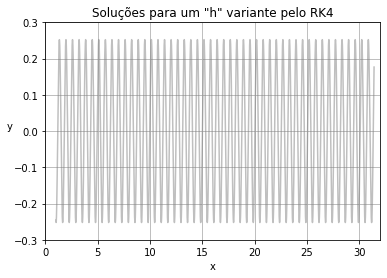

In [25]:
fig, ax = plt.subplots()

ax.set_title('Soluções para um "h" variante pelo RK4')
ax.set_xlabel('x')
ax.set_ylabel('y', rotation=0)
ax.set_xlim([0,32])
ax.set_ylim([-0.3,0.3])
ax.grid(True)
ax.plot(x[0], y_exato, '-', color='gray', alpha=0.5)

In [26]:
lista, = ax.plot([], [], '-', color='brown')

In [27]:
def graficos(i):
  lista.set_data(x[i], y[i])
  lista.set_label('h = '+str(round(hs[i], 3)))
  ax.legend(loc='upper right')
  
  return lista,

In [28]:
anim = animation.FuncAnimation(fig, graficos, frames=500, interval=60)
anim